## Installing Pillow

* you might need some more dependencies all covered in the [docs](https://pillow.readthedocs.io/en/stable/installation.html)

In [1]:
!pip3 install Pillow

## import

In [2]:
from PIL import Image, ImageFilter
from IPython.display import clear_output
import os

## Using the Image Class

In [3]:
try:
    img = Image.open("./pics/disneyrob.jpg")
    print(type(img))
except:
    print("yikes didn't open boss")

<class 'PIL.JpegImagePlugin.JpegImageFile'>


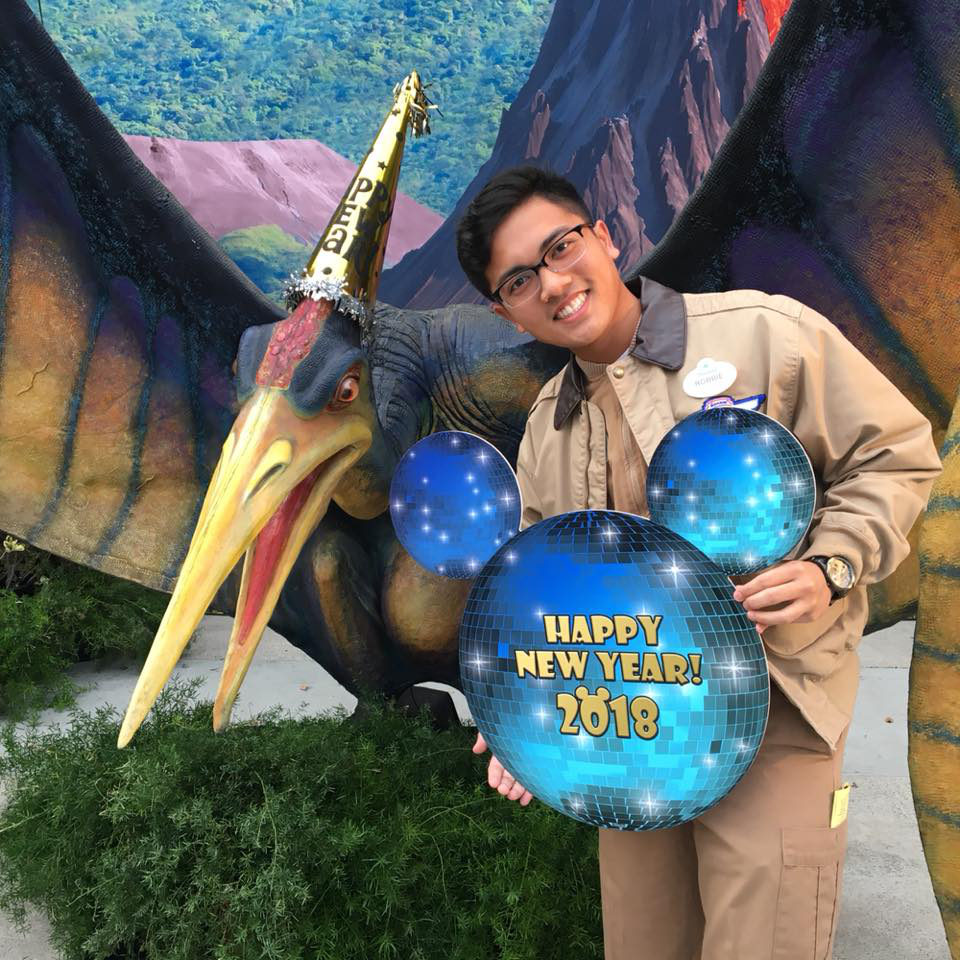

In [4]:
img

Let's get the information about the picture

In [5]:
print("The size of the Image is: ")
print(img.format, img.size, img.mode)


The size of the Image is: 
JPEG (960, 960) RGB


## Saving an image

In [6]:
img.save("./pngs/newyear.png")

**Modes** 
The mode of an image defines the type and depth of a pixel in the image 
- 1: 1-bit pixels, black and white
- L: 8-bit pixels, black and white
- P: 8-bit pixels, mapped to any other mode using a color palette 
- RGB: 3x8-bit pixels: true color
- RGBA: 4x8-bit pixels: true color w transparency mask 
- CMYK: 4x8-bit pixels: color separation 
- YCbCr 3x8-bit pixels, color video format 
    - Refers to JPEG 


Pillow allows you to convert images between different pixel representations using the convert() method.  
The library supports transformations between each supported mode and the “L” and “RGB” modes.  
To convert between other modes, you may have to use an intermediate image (typically an “RGB” image).



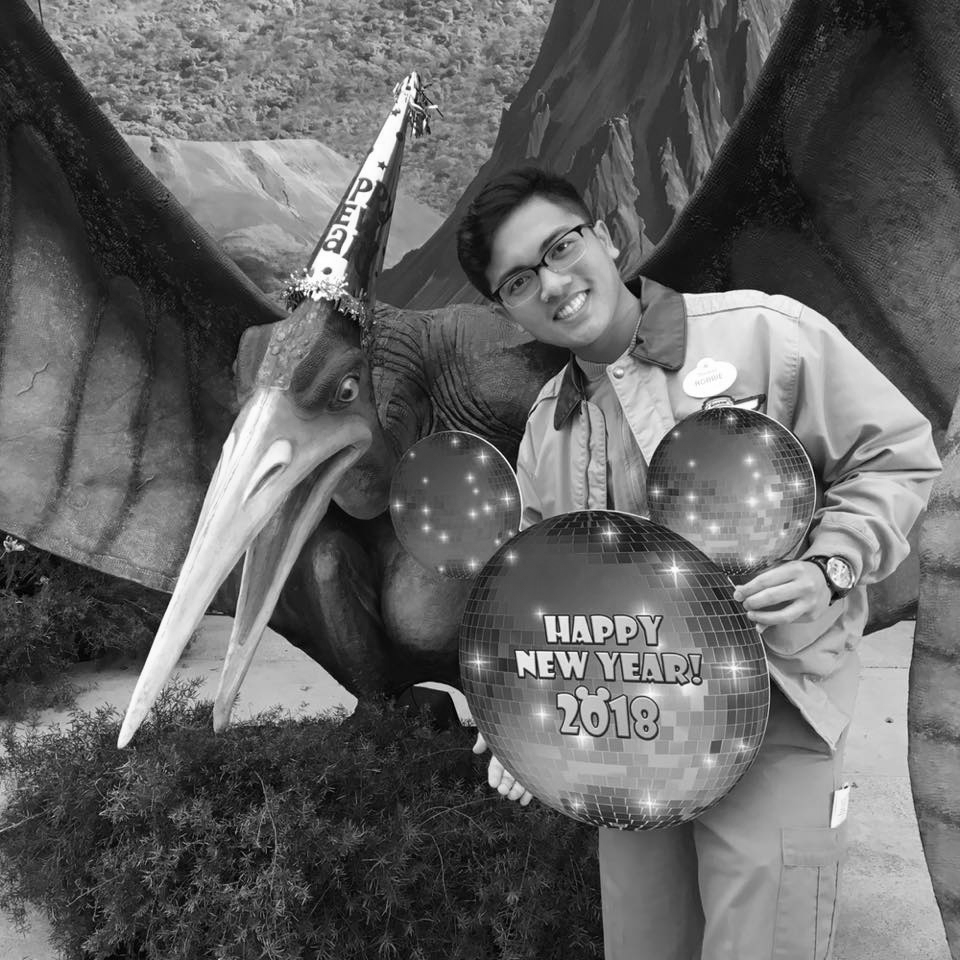

In [7]:
test = img.convert("L")
test

**Bands** 

Images can consist of one or more bands of data. Pillow allows you to store several bands in a single image, provided they all have the same dimensions and depth. For example, a PNG image could have ‘R’, ‘G’, ‘B’, and ‘A’ bands for the red, green, blue, and alpha transparency values. Many operations act on each band separately, e.g., histograms. It is often useful to think of each pixel as having one value per band


**Let stript the bands of the RGB image and merge() them in a different order**

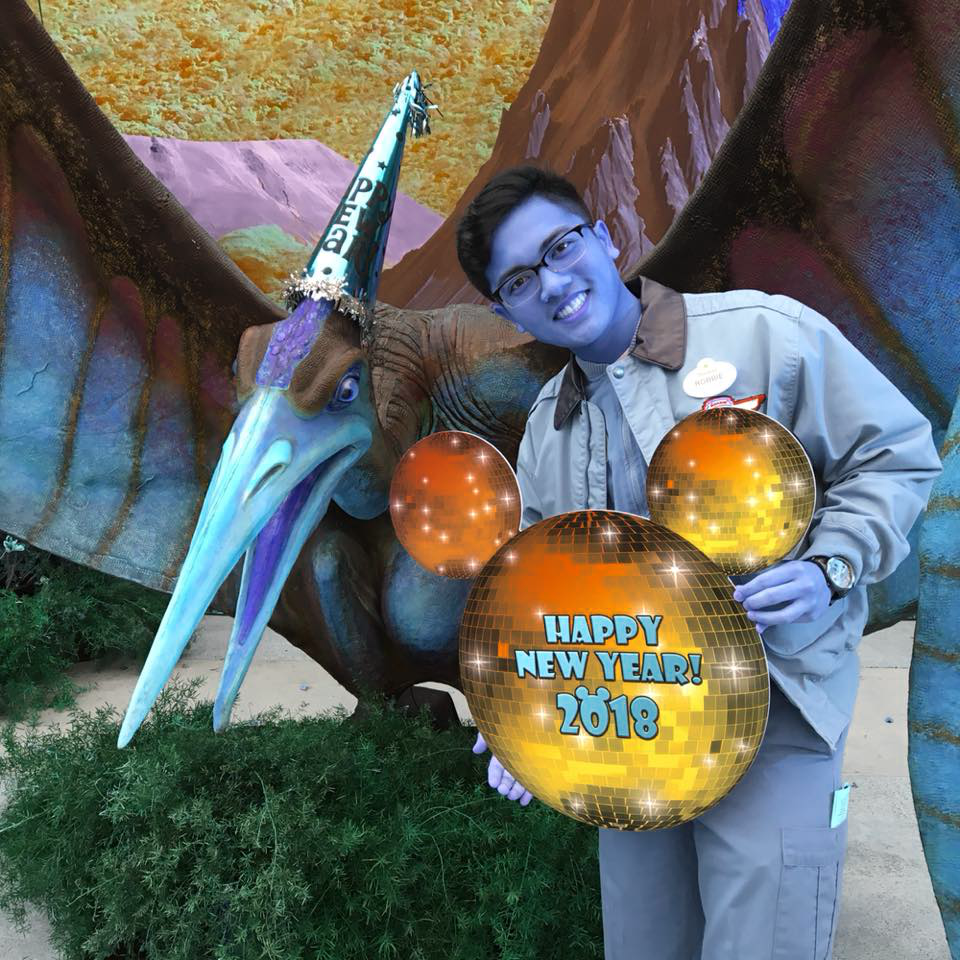

In [8]:
# incredible hulk
r, g, b = img.split()
im = Image.merge("RGB", (b, g, r))
im

## What's that you have a logo and tired of manually putting them on??


In [9]:
img = Image.open('./pics/disneyrob.jpg')
logo = Image.open('logo.png')
logo.size

(200, 200)

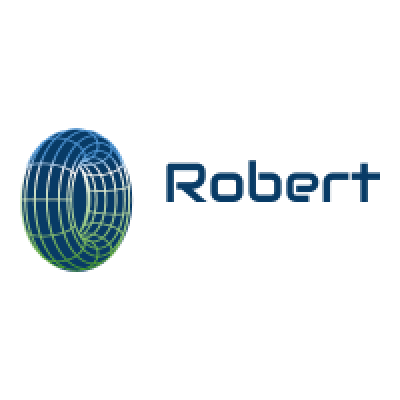

In [10]:
test = logo.resize((400, 400))
test

In [11]:
def getPosition(img,logo):
    return ((img.width - logo.width), (img.height - logo.height))

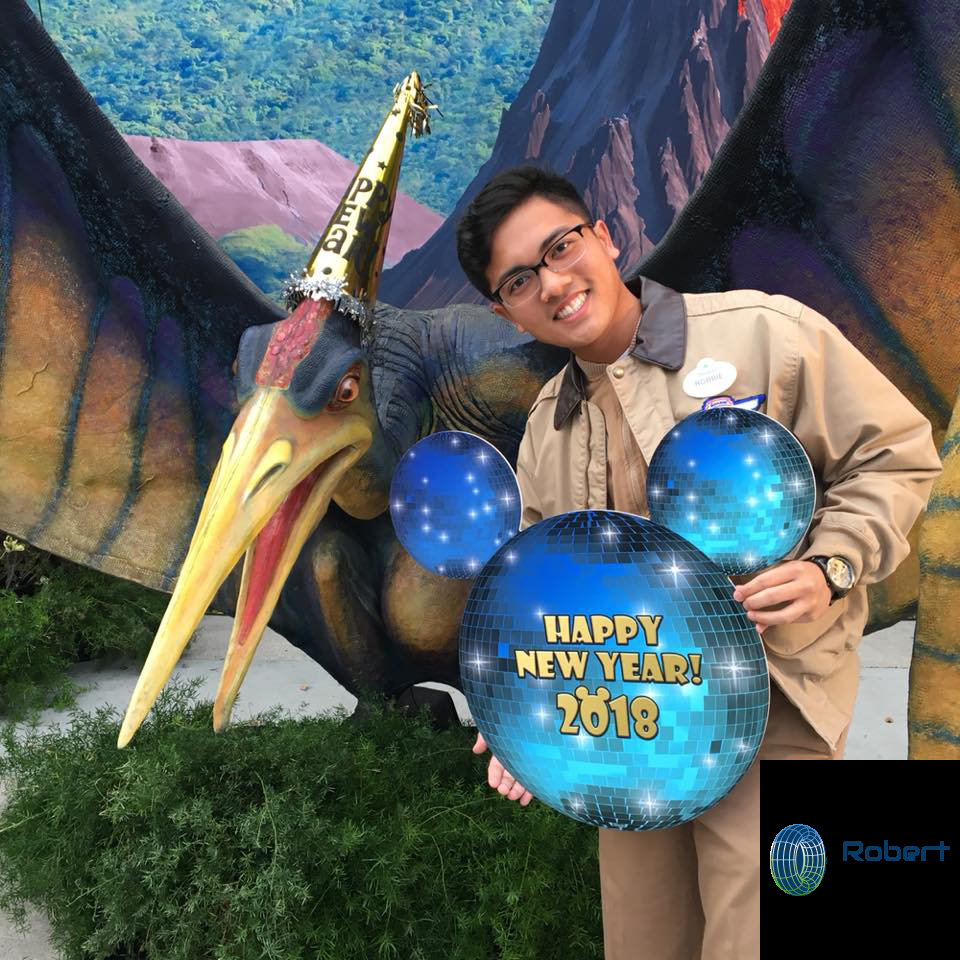

In [12]:
bad_copy = img.copy()
position = getPosition(img,logo)
bad_copy.paste(logo, position)
bad_copy.save('./logoed/bad_paste.jpg')
bad_copy

### Wait a minute the logo has a transparent background what happened??

By default, when you perform a paste, transparent pixels are pasted as solid pixels, thus the black (white on some OSs) box surrounding the logo.  
Soooo we need an additional parameter in paste for masking

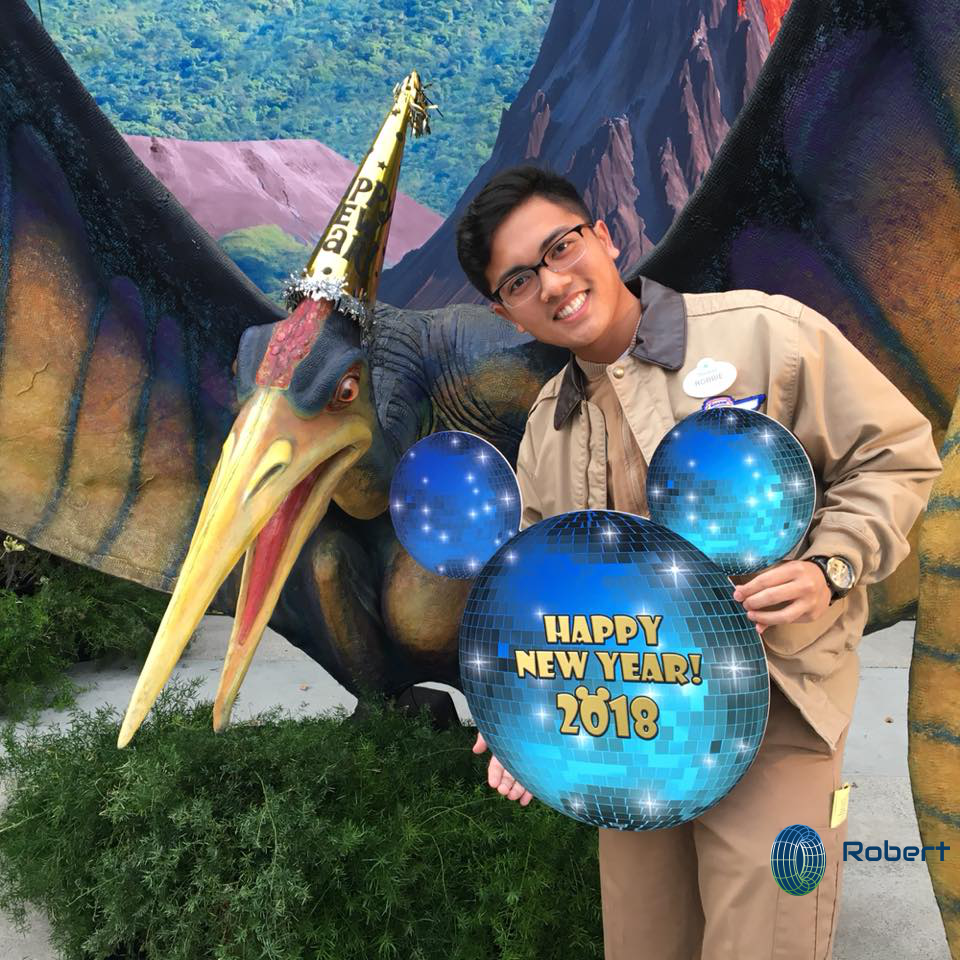

In [13]:
img = Image.open('./pics/disneyrob.jpg')
good_copy = img.copy()
position = getPosition(img,logo)
# add a third argument for masking
good_copy.paste(logo, position,logo)
good_copy.save('./logoed/good_paste.jpg')
good_copy

In [14]:
img.size

(960, 960)

### Let's do it to all of our pictures

In [15]:
def getLogo(p,l):
    w = int(p.width * 0.2)
    return l.resize((w,w))

In [16]:
for f in os.listdir('./pics'):
    #sanity check that it is a jpg
    if f.endswith('jpg') and not f.startswith('gif'):
        
        #open the image
        pic = Image.open('./pics/' + f)
        
        #save the name and the extention for saving
        fn, fext = os.path.splitext(f)
        
        newLogo = getLogo(pic,logo)
        
        #get position to place logo
        position = getPosition(pic,newLogo)
        
        #paste logo 
        pic.paste(newLogo, position,newLogo)
        
        # save into our logoed folder
        pic.save('./logoed/{}_logo{}'.format(fn, fext))

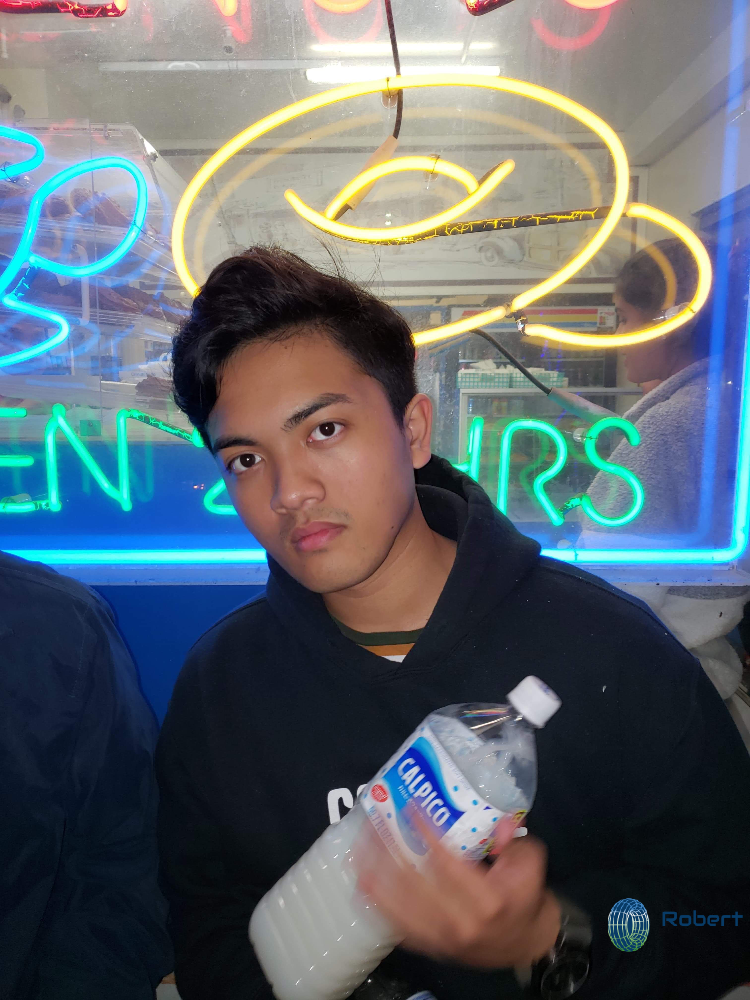

In [17]:
pic

## Pictures are too big lets make them smaller

To do this we'll try the resize method

In [18]:
image = Image.open('./pics/handsome.jpg')

(6000, 4000)
(400, 400)


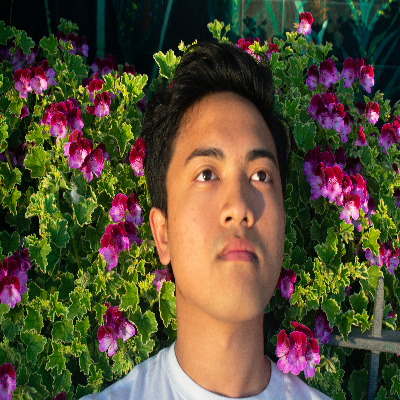

In [19]:
new_image = image.resize((400, 400))
new_image.save('sohandsome_400.jpg')
print(image.size) # Output: (1200, 776)
print(new_image.size) # Output: (400, 400)
new_image

## whoa that didn't work 
- Lets try the thumbnail method

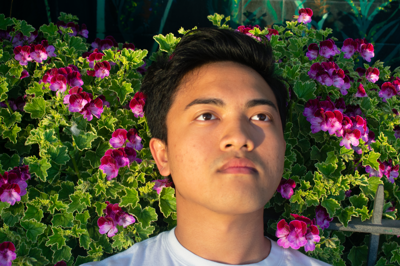

In [20]:
image.thumbnail((400, 400))
image.save('thumbnail_400.jpg')
image

## So much better but lets do this for all the images

In [21]:
#Set our bounds for resizing the image
size = (300,300)

for f in os.listdir('./logoed'):
    #sanity check that it is a jpg
    if f.endswith('jpg'):
        #open the image
        pic = Image.open('./logoed/' + f)
        #save the name and the extention for saving
        fn, fext = os.path.splitext(f)
        # Calculate the output pixel value using a 
        # high-quality Lanczos filter (a truncated sinc) 
        # on all pixels that may contribute to the output value. 
        pic.thumbnail(size,Image.LANCZOS)
        # lastly save it into the thumbnail folder
        pic.save('thumb/{}_tmb{}'.format(fn, fext))

In [22]:
os.listdir('./thumb/')

['seaside_me_tmb.jpg',
 'me_top_left_logo_tmb.jpg',
 'buzzlightyear_tmb.jpg',
 'gif3_logo_tmb.jpg',
 'what_logo_tmb.jpg',
 '.DS_Store',
 'disneyrob_logo_tmb.jpg',
 'gif1_tmb.jpg',
 'newcover_logo_tmb.jpg',
 'gif2_logo_tmb.jpg',
 'gif3_tmb.jpg',
 'me_top_left_tmb.jpg',
 'bad_paste_tmb.jpg',
 'highscore_logo_tmb.jpg',
 'gif2_tmb.jpg',
 'orange_tmb.jpg',
 'disneyrob_tmb.jpg',
 'highscore_tmb.jpg',
 'handsome_tmb.jpg',
 'good_paste_tmb.jpg',
 'newcover_tmb.jpg',
 'buzzlightyear_logo_tmb.jpg',
 'handsome_logo_tmb.jpg',
 'orange_logo_tmb.jpg',
 'seaside_me_logo_tmb.jpg',
 'gif1_logo_tmb.jpg',
 'what_tmb.jpg']

## ImageFilter Module  

The ImageFilter module contains definitions for a pre-defined set of filters, which can be be used with the Image.filter() method.

### Filters
- Predefined
    - BLUR
    - CONTOUR
    - DETAIL
    - EDGE_ENHANCE
    - EDGE_ENHANCE_MORE
    - EMBOSS
    - FIND_EDGES
    - SHARPEN
    - SMOOTH
    - SMOOTH_MORE

In [23]:
try:
    # Load an image with file path
    imgs = []
    pic = Image.open("./thumb/handsome_tmb.jpg")
    filters = [ImageFilter.BLUR,ImageFilter.CONTOUR,ImageFilter.DETAIL,ImageFilter.EDGE_ENHANCE,
               ImageFilter.EDGE_ENHANCE_MORE,ImageFilter.EMBOSS,ImageFilter.FIND_EDGES,ImageFilter.SHARPEN,
              ImageFilter.SMOOTH,ImageFilter.SMOOTH_MORE]
    for f in filters:
        fpic = pic.filter(f)
        print(f)
        #fpic.show()
        #input("Press Enter for next filter")
        clear_output()
        imgs.append(fpic)
    fpic
#     gazblurred = pic.filter(ImageFilter.GaussianBlur(5))
#     box = pic.filter(ImageFilter.BoxBlur(10))

    # Display images
#     pic.show()
#     blurred.show()
#     box.show()

    # save the new image
    #blurred.save("blurred.png")
    #box.save("box.png")

except:
    print ("Unable to load image")

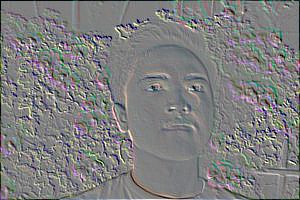

In [24]:
imgs[5]

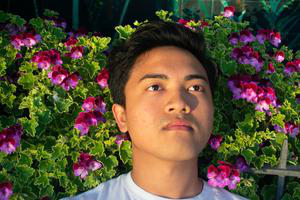

In [25]:
pic

## wow much color lets see a graph

In [26]:
def rem(duplicate): 
    final_list = [] 
    for num in duplicate: 
        if num not in final_list: 
            final_list.append(num) 
    return final_list 

In [27]:
x,y,z = pic.getpixel((0,0))
print(x,y,z)

0 3 9


In [28]:
width, height = pic.size
rfreq = dict(zip([i for i in range(0,256)], [0 for x in range(0,256)]))
gfreq = dict(zip([i for i in range(0,256)], [0 for x in range(0,256)]))
bfreq = dict(zip([i for i in range(0,256)], [0 for x in range(0,256)]))
for w in range(0,width):
    for h in range(0,height):
        x, y, z = pic.getpixel((w,h))
        rfreq[x] += 1
        gfreq[y] += 1
        bfreq[z] += 1
        
        

In [29]:
#https://stackoverflow.com/questions/41904762/python-compute-frequency-of-unique-elements
#getting the frequency of each pixel
# pix = rem(pixels)
# frequency = dict(zip(pix, [0 for x in range(0,len(pix))]))

# for p in pixels:
#     frequency[p]+=1


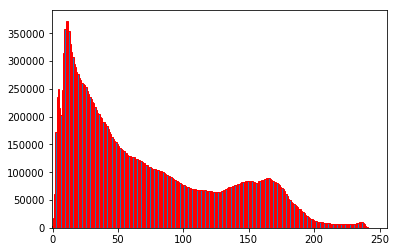

In [30]:
#https://stackoverflow.com/questions/22159160/python-calculate-histogram-of-image
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import cv2

# read image
im = cv2.imread('./pics/handsome.jpg')
#print(im)
# calculate mean value from RGB channels and flatten to 1D array
vals = im.mean(axis=2).flatten()
# calculate histogram
counts, bins = np.histogram(vals, range(257))
# plot histogram centered on values 0..255
plt.bar(bins[:-1] - 0.5, counts, width=1, edgecolor='r')
plt.xlim([-0.5, 255.5])
plt.show()

# Ok fun time lets make a gif 
- [source](http://www.pythoninformer.com/python-libraries/pillow/creating-animated-gif/)

In [31]:
import os 
images = []

for f in os.listdir('./pics'):
    if f.startswith('gif'):
        frame = Image.open('./pics/' + f)
        yeet = frame.filter(ImageFilter.FIND_EDGES)
        images.append(yeet)
    

# Save the frames as an animated GIF
images[0].save('./gif/sf_street.gif',
               save_all=True,
               append_images=images[1:],
               duration=150,
               loop=0)


[Lets check it out](./gif/sf_street.gif "segment")